# *Last Mile Delivery : Customer Delivery Time Optimization* 



Over- and Underestimation of `CDT` is very common, everyone has experienced this with online vendors at one time or the other. Although on the face of it overestimation of `CDT` appears to be a good problem to have, delivering say food to an apartment earlier than a customer expects can be a bad thing, because the customer may be on his way home. This can also lead to inefficiencies in deliveries as this affects other orders,as the delivery rep may have to wait for the customer which ultimately results in under utilization of human resources. Underestimation as we know also puts a lot of pressure on logistics staff and this also leads to inaccuracies in deliveries. It is best to predict `CDT` and deliver orders within acceptable thresholds industry/company policies.

**There are a lot of factors that affect `CDT`, e.g driving time, size of order, weight of order, customer location, traffic, holidays, weathers, time of year etc.** To be able to predict `CDT`, historical data on the listed factors is crucial.


The purpose of this Notebook is to explore and predict `CDT`, using Olist orders and transaction data. Olist is the largest department store in Brazilian marketplaces. Olist connects small businesses from all over Brazil to channels without hassle and with a single contract. The Olist data can be explored on Kaggle.


## Problem Statement

`“How might we optimize customer delivery time by predicting future orders from historical data (including both external and internal factors)?”`

The required range of features to be used for this project is divided in 3 broad categories:


1. Customer:  This includes but not limited to, customer location, type of customer, type of apartment etc  

2. Order: This includes order size, order weight,purchase date,approval date,   

3. External Factors:  This includes mostly weather conditions; Rainfall and Temperature. Others are Holidays, traffic etc.


## The Data

**The data to be used is the Olist public data sets available on Kaggle. This dataset was generously provided by Olist, the largest department store in Brazilian marketplaces. Olist connects small businesses from all over Brazil to channels without hassle and with a single contract. Those merchants are able to sell their products through the Olist Store and ship them directly to the customers using Olist logistics partners.The dataset has information of 100k orders from 2016 to 2018 made at multiple marketplaces in Brazil. **

Below is Data schema of all the provided data tables.

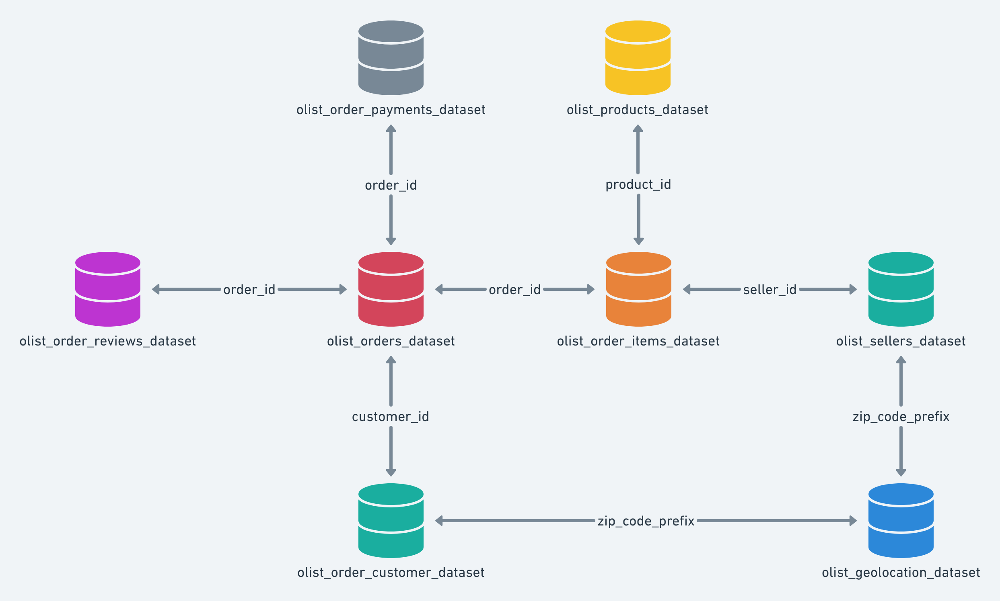


### Importing all the packages

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import time
import geopy.distance
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
import optuna
# For scraping
import requests
from sklearn.metrics import r2_score
from bs4 import BeautifulSoup

import warnings
warnings.filterwarnings("ignore")

### Importing all the Datasets

In [2]:
customers = pd.read_csv("data/olist_customers_dataset.csv")           
geolocation = pd.read_csv("data/olist_geolocation_dataset.csv")         
orderItems = pd.read_csv("data/olist_order_items_dataset.csv")         
orderPayments = pd.read_csv("data/olist_order_payments_dataset.csv")      
orderReviews = pd.read_csv("data/olist_order_reviews_dataset.csv")
orders = pd.read_csv("data/olist_orders_dataset.csv")
products = pd.read_csv("data/olist_products_dataset.csv")
sellers = pd.read_csv("data/olist_sellers_dataset.csv")
productCategory = pd.read_csv("data/product_category_name_translation.csv")

Exploration of all the datasets is very important, especially the ones relevant to out model

In [3]:
print(f'Customers table has the shape {customers.shape}')
print(f'Sellers table has the shape {sellers.shape}')
print(f'Orders table has the shape {orders.shape}')
print(f'OrderItems table has the shape {orderItems.shape}')
print(f'Products table has the shape {products.shape}')
print(f'ProductCategory table has the shape {productCategory.shape}')

Customers table has the shape (99441, 5)
Sellers table has the shape (3095, 4)
Orders table has the shape (99441, 8)
OrderItems table has the shape (112650, 7)
Products table has the shape (32951, 9)
ProductCategory table has the shape (71, 2)


# Exploratory Data Analysis and Pre-Processing

We will break down our EDA task into 4 main categories

- Customers - We will explore all the important things about the `Customers`, this will involve merging different tables
- Sellers - We will explore all the important things about the `Sellers`, this will involve merging different tables

- Orders  - Order details and order items 

- Product - the product being purchased and transported to the customer

## Customers

In [4]:
# A preview of the customers table
customers.head()

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,sao paulo,SP
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,8775,mogi das cruzes,SP
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,campinas,SP


In [5]:
customers.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99441 entries, 0 to 99440
Data columns (total 5 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   customer_id               99441 non-null  object
 1   customer_unique_id        99441 non-null  object
 2   customer_zip_code_prefix  99441 non-null  int64 
 3   customer_city             99441 non-null  object
 4   customer_state            99441 non-null  object
dtypes: int64(1), object(4)
memory usage: 3.8+ MB


The table appears okay for now, but the customer table alone is not giving any important information asides the location of each customers `(customer_zip_code_prefix,customer_city,customer_state)`.

Let see how many of many orders comes from the represented states graphically

In [6]:
grouped_states = customers.groupby('customer_state')['customer_state'].count().sort_values()
grouped_states

customer_state
RR       46
AP       68
AC       81
AM      148
RO      253
TO      280
SE      350
AL      413
RN      485
PI      495
PB      536
MS      715
MA      747
MT      907
PA      975
CE     1336
PE     1652
GO     2020
ES     2033
DF     2140
BA     3380
SC     3637
PR     5045
RS     5466
MG    11635
RJ    12852
SP    41746
Name: customer_state, dtype: int64

In [7]:
fig = px.bar(grouped_states, 
                 x=grouped_states.values, 
                 y=grouped_states.index.values,
                 labels ={'y':'States','x':'Number of Orders'},
                 title='Total Number of Orders by State'
                )
fig.show()

From the above plot it could be seen that a large percent of the order came from Sao Paolo with ~41k orders and Rio De janeiro with ~13k

In [8]:
grp_location_df = customers.groupby(['customer_state','customer_city'])['customer_zip_code_prefix'].count().sort_values()
grp_location_df = grp_location_df.reset_index()
grp_location_df.columns = ['customer_state','customer_city','count']
grp_location_df

,customer_state,customer_city,count
0,AC,brasileia,1
1,RS,barao,1
2,MG,fonseca,1
3,RS,barao do triunfo,1
4,MG,felixlandia,1
...,...,...,...
4305,PR,curitiba,1521
4306,DF,brasilia,2131
4307,MG,belo horizonte,2773
4308,RJ,rio de janeiro,6882


In [9]:
fig = px.sunburst(grp_location_df, path=['customer_state', 'customer_city'], values='count',
                 title='Total Number of Orders by City')
fig.show()

It can be seen from the above that most of the orders originates from sao paulo and rio de janeiro,both are also coincidentally states too, which other cities. 

Now that we know the major city hubs in all the states, we may want to look at them on map.

#### Next we get the `lat` and `lng` from the `geo table`

Taking a look at the goelocation table to see what can be added to the customer table

In [10]:
#geolocation table
geolocation.head()

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
0,1037,-23.545621,-46.639292,sao paulo,SP
1,1046,-23.546081,-46.644820,sao paulo,SP
2,1046,-23.546129,-46.642951,sao paulo,SP
3,1041,-23.544392,-46.639499,sao paulo,SP
4,1035,-23.541578,-46.641607,sao paulo,SP


There appears to be duplicates in the geolocations table, this will be explored further by check the number of `	geolocation_zip_code_prefix = 1046`	 that exists

In [11]:
# checking for duplicates in the geo-data

geolocation[geolocation['geolocation_zip_code_prefix']==1046]

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
1,1046,-23.546081,-46.644820,sao paulo,SP
2,1046,-23.546129,-46.642951,sao paulo,SP
15,1046,-23.546081,-46.644820,sao paulo,SP
19,1046,-23.545884,-46.643163,sao paulo,SP
20,1046,-23.545166,-46.643786,sao paulo,SP
...,...,...,...,...,...
1432,1046,-23.545166,-46.643786,sao paulo,SP
1437,1046,-23.547191,-46.642923,sao paulo,SP
1439,1046,-23.545158,-46.643880,sao paulo,SP
1450,1046,-23.545292,-46.643130,sao paulo,SP


A total of `141`, this proves there are duplicates in the table, for various locations at the very least for `	geolocation_zip_code_prefix = 1046` 

Therefore, teh duplicates will be removed and a new table `geo` will be created

In [12]:
geo = geolocation[~geolocation['geolocation_zip_code_prefix'].duplicated()]
len(geo),len(geolocation)

(19015, 1000163)

Over 980k duplicates were removed

- Appears Olist needs to revise the method of retriving locations, this will save spcae and time

Now merging the location,`geo`, to with the customers table selecting the neccesary columns 

In [13]:
# Adding the customer location to the customer table

customer_with_location = customers.merge(geo[['geolocation_zip_code_prefix', 'geolocation_lat', 'geolocation_lng']], left_on='customer_zip_code_prefix', right_on='geolocation_zip_code_prefix',how='left')
customer_with_location.head()

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP,14409.0,-20.509897,-47.397866
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP,9790.0,-23.726853,-46.545746
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,sao paulo,SP,1151.0,-23.527788,-46.660310
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,8775,mogi das cruzes,SP,8775.0,-23.496930,-46.185352
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,campinas,SP,13056.0,-22.987222,-47.151073


In [14]:
# Dropping the irrelevant column and renaming the lon and lat columns
customer_with_location.drop('geolocation_zip_code_prefix', axis =1, inplace = True)

customer_with_location.columns = ['customer_id', 'customer_unique_id', 'customer_zip_code_prefix',
                                'customer_city', 'customer_state','customer_lat', 'customer_lng']

In [15]:
customer_with_location.groupby('customer_zip_code_prefix')['customer_lat','customer_lng'].mean()

,customer_lat,customer_lng
customer_zip_code_prefix,,
1003,-23.549032,-46.635313
1004,-23.550116,-46.635122
1005,-23.549819,-46.635606
1006,-23.550524,-46.636694
1007,-23.550393,-46.637302
...,...,...
99960,-27.953797,-52.029641
99965,-28.173892,-52.038447
99970,-28.345143,-51.876926


Now visualizing all the information on a Map

In [16]:
fig = px.scatter_mapbox(customer_with_location, lat="customer_lat", lon="customer_lng", color="customer_state", size_max=5, zoom=10,
                  mapbox_style="carto-positron",title='Map showing recorded customer order locations',opacity=0.05)
fig.show()

It can be seen where most of the orders came from by may inspecting the map, 

- I appears there are outliers in the location data, this will be handled, by checking we know the GPS coordinates of Brazil are 14.2350° S and 51.9253° W. We can fix the coordinates beyond this points

In [17]:
geo[(geo['geolocation_lat']< -37) | (geo['geolocation_lng'] < -75) ]

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state


In [18]:
#locating the outliers in the data

geo[(geo['geolocation_lat']>5) | (geo['geolocation_lng'] >0) ]

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
387565,18243,28.008978,-15.536867,bom retiro da esperanca,SP
513631,28165,41.614052,-8.411675,vila nova de campos,RJ
769333,68275,41.146203,-8.577855,porto trombetas,PA
822529,78131,38.816816,-9.394625,varzea grande,MT
860562,83252,42.184003,-8.723762,ilha dos valadares,PR
865611,83810,39.057629,-9.400037,areia branca dos assis,PR
965687,95130,14.585073,121.105394,santa lucia do piai,RS


Checking for `Nulls` in the customer table

In [19]:
customer_with_location.isna().sum()

customer_id                   0
customer_unique_id            0
customer_zip_code_prefix      0
customer_city                 0
customer_state                0
customer_lat                278
customer_lng                278
dtype: int64

There are `278 Nulls` in the customer table, 

removing the problematic geo-data points

In [20]:
customer_with_location = customer_with_location[~((customer_with_location['customer_lat']>5)|(customer_with_location['customer_lng']>0))]

In [21]:
customer_with_location[customer_with_location.isna().any(axis=1)].shape[0]/customer_with_location.shape[0] *100

0.27957962488057525

The missing values are just `~0.2%` of the whole data so we will drop them

In [22]:
customer_with_location = customer_with_location[customer_with_location.notna()]

## Sellers

Going through the same process as that done with the customers table

In [23]:
sellers.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3095 entries, 0 to 3094
Data columns (total 4 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   seller_id               3095 non-null   object
 1   seller_zip_code_prefix  3095 non-null   int64 
 2   seller_city             3095 non-null   object
 3   seller_state            3095 non-null   object
dtypes: int64(1), object(3)
memory usage: 96.8+ KB


No null value and the data format appears okay for now

In [24]:
#ploting to graphically see the number of sellers

grouped__seller_states = sellers.groupby('seller_state')['seller_state'].count().sort_values()
fig = px.bar(grouped__seller_states, 
                 x=grouped__seller_states.values, 
                 y=grouped__seller_states.index.values,
                 labels ={'y':'States','x':'Number of Sellers'},
                 title='Total Number of Sellers by State'
                )
fig.show()

Similar trend with the customer table, `Sao paolo` has teh highest number of sellers

In [25]:
grp_location_df = sellers.groupby(['seller_state','seller_city'])['seller_zip_code_prefix'].count().sort_values()
grp_location_df = grp_location_df.reset_index()
grp_location_df.columns = ['seller_state','seller_city','count']
grp_location_df

,seller_state,seller_city,count
0,AC,rio branco,1
1,SE,aracaju,1
2,SC,xaxim,1
3,SC,taio,1
4,SC,sao miguel do oeste,1
...,...,...,...
631,SP,ribeirao preto,52
632,MG,belo horizonte,66
633,RJ,rio de janeiro,93
634,PR,curitiba,124


In [26]:
fig = px.sunburst(grp_location_df, path=['seller_state', 'seller_city'], values='count',
                 title='Total Number of Sellers by City')
fig.show()

In [27]:
sellers_with_location = sellers.merge(geo[['geolocation_zip_code_prefix', 'geolocation_lat', 'geolocation_lng']],
                                      left_on='seller_zip_code_prefix', right_on='geolocation_zip_code_prefix')
sellers_with_location.head()

,seller_id,seller_zip_code_prefix,seller_city,seller_state,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng
0,3442f8959a84dea7ee197c632cb2df15,13023,campinas,SP,13023,-22.898536,-47.063125
1,e0eabded302882513ced4ea3eb0c7059,13023,campinas,SP,13023,-22.898536,-47.063125
2,d1b65fc7debc3361ea86b5f14c68d2e2,13844,mogi guacu,SP,13844,-22.382941,-46.946641
3,ce3ad9de960102d0677a81f5d0bb7b2d,20031,rio de janeiro,RJ,20031,-22.910641,-43.176510
4,1d2732ef8321502ee8488e8bed1ab8cd,20031,rio de janeiro,RJ,20031,-22.910641,-43.176510


In [28]:
# Dropping the irrelevant column and renaming the lon and lat columns
sellers_with_location.drop('geolocation_zip_code_prefix', axis =1, inplace = True)

sellers_with_location.columns = ['seller_id', 'seller_zip_code_prefix', 'seller_city', 'seller_state',
                                'seller_lat', 'seller_lng']

In [29]:
sellers_with_location.isna().sum()

seller_id                 0
seller_zip_code_prefix    0
seller_city               0
seller_state              0
seller_lat                0
seller_lng                0
dtype: int64

Great! no missing values

### Products

- The goal here is to explore the product related table as it relates to this analysis

- Check for missing values, clean the data as required

- Extract product related insights

In [30]:
# A preview of the table
products.head()

,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
0,1e9e8ef04dbcff4541ed26657ea517e5,perfumaria,40.0,287.0,1.0,225.0,16.0,10.0,14.0
1,3aa071139cb16b67ca9e5dea641aaa2f,artes,44.0,276.0,1.0,1000.0,30.0,18.0,20.0
2,96bd76ec8810374ed1b65e291975717f,esporte_lazer,46.0,250.0,1.0,154.0,18.0,9.0,15.0
3,cef67bcfe19066a932b7673e239eb23d,bebes,27.0,261.0,1.0,371.0,26.0,4.0,26.0
4,9dc1a7de274444849c219cff195d0b71,utilidades_domesticas,37.0,402.0,4.0,625.0,20.0,17.0,13.0


In [31]:
# the datatypes in the table
products.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32951 entries, 0 to 32950
Data columns (total 9 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   product_id                  32951 non-null  object 
 1   product_category_name       32341 non-null  object 
 2   product_name_lenght         32341 non-null  float64
 3   product_description_lenght  32341 non-null  float64
 4   product_photos_qty          32341 non-null  float64
 5   product_weight_g            32949 non-null  float64
 6   product_length_cm           32949 non-null  float64
 7   product_height_cm           32949 non-null  float64
 8   product_width_cm            32949 non-null  float64
dtypes: float64(7), object(2)
memory usage: 2.3+ MB


It appears there are missing values in the table, I will explore this further

In [32]:
products.isna().sum()

product_id                      0
product_category_name         610
product_name_lenght           610
product_description_lenght    610
product_photos_qty            610
product_weight_g                2
product_length_cm               2
product_height_cm               2
product_width_cm                2
dtype: int64

Most of the missing values are coming from the `product_category_name,product_name_lenght,product_description_lenght ,product_photos_qty ` columns. bearing in mind that not all these columns are relevant, I will explore them further.

First by checking the above columns

In [33]:
products[products['product_category_name'].isna()]

,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
105,a41e356c76fab66334f36de622ecbd3a,NaN,NaN,NaN,NaN,650.0,17.0,14.0,12.0
128,d8dee61c2034d6d075997acef1870e9b,NaN,NaN,NaN,NaN,300.0,16.0,7.0,20.0
145,56139431d72cd51f19eb9f7dae4d1617,NaN,NaN,NaN,NaN,200.0,20.0,20.0,20.0
154,46b48281eb6d663ced748f324108c733,NaN,NaN,NaN,NaN,18500.0,41.0,30.0,41.0
197,5fb61f482620cb672f5e586bb132eae9,NaN,NaN,NaN,NaN,300.0,35.0,7.0,12.0
...,...,...,...,...,...,...,...,...,...
32515,b0a0c5dd78e644373b199380612c350a,NaN,NaN,NaN,NaN,1800.0,30.0,20.0,70.0
32589,10dbe0fbaa2c505123c17fdc34a63c56,NaN,NaN,NaN,NaN,800.0,30.0,10.0,23.0
32616,bd2ada37b58ae94cc838b9c0569fecd8,NaN,NaN,NaN,NaN,200.0,21.0,8.0,16.0
32772,fa51e914046aab32764c41356b9d4ea4,NaN,NaN,NaN,NaN,1300.0,45.0,16.0,45.0


Looking at the above the product description columns are not exactly relevant to our model, but may be relevant to our EDA. also the other columns such as the size of product and weight have values which is important to our model. So we will leave them

In [34]:
products[products['product_length_cm'].isna()]

,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
8578,09ff539a621711667c43eba6a3bd8466,bebes,60.0,865.0,3.0,NaN,NaN,NaN,NaN
18851,5eb564652db742ff8f28759cd8d2652a,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


The above is immaterial and not relavant to our analysis and model, therefor we will drop the two rows above

In [35]:
product_df = products[products['product_length_cm'].notna()].copy()
product_df.head()

,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
0,1e9e8ef04dbcff4541ed26657ea517e5,perfumaria,40.0,287.0,1.0,225.0,16.0,10.0,14.0
1,3aa071139cb16b67ca9e5dea641aaa2f,artes,44.0,276.0,1.0,1000.0,30.0,18.0,20.0
2,96bd76ec8810374ed1b65e291975717f,esporte_lazer,46.0,250.0,1.0,154.0,18.0,9.0,15.0
3,cef67bcfe19066a932b7673e239eb23d,bebes,27.0,261.0,1.0,371.0,26.0,4.0,26.0
4,9dc1a7de274444849c219cff195d0b71,utilidades_domesticas,37.0,402.0,4.0,625.0,20.0,17.0,13.0


In [36]:
product_df.isna().sum()

product_id                      0
product_category_name         609
product_name_lenght           609
product_description_lenght    609
product_photos_qty            609
product_weight_g                0
product_length_cm               0
product_height_cm               0
product_width_cm                0
dtype: int64

Now there are no longer null values for the product size but only for the product description and we can live we that.

Next is to calculate the product volume (cm3) from the lenght,witdth and height 

In [37]:
product_df['product_volume_cm3'] = product_df['product_length_cm']*product_df['product_height_cm']*product_df['product_width_cm']
product_df.head()

,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_volume_cm3
0,1e9e8ef04dbcff4541ed26657ea517e5,perfumaria,40.0,287.0,1.0,225.0,16.0,10.0,14.0,2240.0
1,3aa071139cb16b67ca9e5dea641aaa2f,artes,44.0,276.0,1.0,1000.0,30.0,18.0,20.0,10800.0
2,96bd76ec8810374ed1b65e291975717f,esporte_lazer,46.0,250.0,1.0,154.0,18.0,9.0,15.0,2430.0
3,cef67bcfe19066a932b7673e239eb23d,bebes,27.0,261.0,1.0,371.0,26.0,4.0,26.0,2704.0
4,9dc1a7de274444849c219cff195d0b71,utilidades_domesticas,37.0,402.0,4.0,625.0,20.0,17.0,13.0,4420.0


In [38]:
productCategory.head()

,product_category_name,product_category_name_english
0,beleza_saude,health_beauty
1,informatica_acessorios,computers_accessories
2,automotivo,auto
3,cama_mesa_banho,bed_bath_table
4,moveis_decoracao,furniture_decor


In [39]:
productCategory.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 71 entries, 0 to 70
Data columns (total 2 columns):
 #   Column                         Non-Null Count  Dtype 
---  ------                         --------------  ----- 
 0   product_category_name          71 non-null     object
 1   product_category_name_english  71 non-null     object
dtypes: object(2)
memory usage: 1.2+ KB


In [40]:
product_df_eng = product_df[['product_id',
               'product_category_name',
               'product_weight_g','product_volume_cm3']].merge(productCategory,left_on='product_category_name',
                                                              right_on='product_category_name',how='left')
product_df_eng

,product_id,product_category_name,product_weight_g,product_volume_cm3,product_category_name_english
0,1e9e8ef04dbcff4541ed26657ea517e5,perfumaria,225.0,2240.0,perfumery
1,3aa071139cb16b67ca9e5dea641aaa2f,artes,1000.0,10800.0,art
2,96bd76ec8810374ed1b65e291975717f,esporte_lazer,154.0,2430.0,sports_leisure
3,cef67bcfe19066a932b7673e239eb23d,bebes,371.0,2704.0,baby
4,9dc1a7de274444849c219cff195d0b71,utilidades_domesticas,625.0,4420.0,housewares
...,...,...,...,...,...
32944,a0b7d5a992ccda646f2d34e418fff5a0,moveis_decoracao,12300.0,64000.0,furniture_decor
32945,bf4538d88321d0fd4412a93c974510e6,construcao_ferramentas_iluminacao,1700.0,4864.0,construction_tools_lights
32946,9a7c6041fa9592d9d9ef6cfe62a71f8c,cama_mesa_banho,1400.0,5103.0,bed_bath_table
32947,83808703fc0706a22e264b9d75f04a2e,informatica_acessorios,700.0,8060.0,computers_accessories


In [41]:
product_df_eng.isna().sum()

product_id                         0
product_category_name            609
product_weight_g                   0
product_volume_cm3                 0
product_category_name_english    622
dtype: int64

We are expecting only 609 null values in the data which should be coming form the product category, lets exlplore the items that are that is makign teh english column have additional 13 nulls

In [42]:
product_df_eng[(product_df_eng['product_category_name_english'].isna()) & 
               (product_df_eng['product_category_name'].notna())]['product_category_name'].unique()

array(['pc_gamer', 'portateis_cozinha_e_preparadores_de_alimentos'],
      dtype=object)

On checking google `portateis_cozinha_e_preparadores_de_alimentos` appears to be some translated loosely as `portable_kitchen_and_food_preparator`  and `pc_gamer` as `gaming_pc`.

To fix this we will confirm if there is no item like the above in the table then modify the product Category column

In [43]:
productCategory['product_category_name'].sort_values().tail(20)

31                                      market_place
38                         moveis_colchao_e_estofado
26    moveis_cozinha_area_de_servico_jantar_e_jardim
4                                   moveis_decoracao
30                                 moveis_escritorio
47                                     moveis_quarto
42                                       moveis_sala
61                                            musica
12                                         papelaria
53                                               pcs
6                                         perfumaria
29                                          pet_shop
63                       portateis_casa_forno_e_cafe
9                                 relogios_presentes
70                                seguros_e_servicos
52                           sinalizacao_e_seguranca
13                          tablets_impressao_imagem
8                                          telefonia
15                                    telefoni

Appears there are no items like the two above so, we add them to the table

In [44]:
new_category_dict = {'product_category_name':['portateis_cozinha_e_preparadores_de_alimentos','pc_gamer'],
              'product_category_name_english':['portable_kitchen_and_food_preparator','gaming_pc']}

productCategory = productCategory.append(pd.DataFrame(new_category_dict),ignore_index=True)

In [45]:
product_df_eng = product_df[['product_id',
               'product_category_name',
               'product_weight_g','product_volume_cm3']].merge(productCategory,left_on='product_category_name',
                                                              right_on='product_category_name',how='left')
product_df_eng.isna().sum()

product_id                         0
product_category_name            609
product_weight_g                   0
product_volume_cm3                 0
product_category_name_english    609
dtype: int64

Now the data looks much better, we will then clean up the table by remove the portuguese column

In [46]:
product_category_english = product_df_eng[['product_id', 'product_category_name_english', 'product_weight_g',
       'product_volume_cm3']]
product_category_english.head()

,product_id,product_category_name_english,product_weight_g,product_volume_cm3
0,1e9e8ef04dbcff4541ed26657ea517e5,perfumery,225.0,2240.0
1,3aa071139cb16b67ca9e5dea641aaa2f,art,1000.0,10800.0
2,96bd76ec8810374ed1b65e291975717f,sports_leisure,154.0,2430.0
3,cef67bcfe19066a932b7673e239eb23d,baby,371.0,2704.0
4,9dc1a7de274444849c219cff195d0b71,housewares,625.0,4420.0


### Orders

First a preview of the `orderItems` table

In [47]:
orderItems.head()

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.90,13.29
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.93
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.00,17.87
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.79
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.14


In [48]:
#checking the data type of the table, especially the shipping_limit_date column

orderItems.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 112650 entries, 0 to 112649
Data columns (total 7 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   order_id             112650 non-null  object 
 1   order_item_id        112650 non-null  int64  
 2   product_id           112650 non-null  object 
 3   seller_id            112650 non-null  object 
 4   shipping_limit_date  112650 non-null  object 
 5   price                112650 non-null  float64
 6   freight_value        112650 non-null  float64
dtypes: float64(2), int64(1), object(4)
memory usage: 6.0+ MB


In [49]:
# we need to convert the shipping_limit_date to datetime

orderItems['shipping_limit_date']= pd.to_datetime(orderItems['shipping_limit_date'])
orderItems.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 112650 entries, 0 to 112649
Data columns (total 7 columns):
 #   Column               Non-Null Count   Dtype         
---  ------               --------------   -----         
 0   order_id             112650 non-null  object        
 1   order_item_id        112650 non-null  int64         
 2   product_id           112650 non-null  object        
 3   seller_id            112650 non-null  object        
 4   shipping_limit_date  112650 non-null  datetime64[ns]
 5   price                112650 non-null  float64       
 6   freight_value        112650 non-null  float64       
dtypes: datetime64[ns](1), float64(2), int64(1), object(3)
memory usage: 6.0+ MB


Next, previewing the `Orders` table and checking the repective datatypes

In [50]:
orders.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15 00:00:00
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26 00:00:00


In [51]:
orders.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99441 entries, 0 to 99440
Data columns (total 8 columns):
 #   Column                         Non-Null Count  Dtype 
---  ------                         --------------  ----- 
 0   order_id                       99441 non-null  object
 1   customer_id                    99441 non-null  object
 2   order_status                   99441 non-null  object
 3   order_purchase_timestamp       99441 non-null  object
 4   order_approved_at              99281 non-null  object
 5   order_delivered_carrier_date   97658 non-null  object
 6   order_delivered_customer_date  96476 non-null  object
 7   order_estimated_delivery_date  99441 non-null  object
dtypes: object(8)
memory usage: 6.1+ MB


appears there are missing values in some columns

In [52]:
orders.isna().sum()/orders.shape[0] *100

order_id                         0.000000
customer_id                      0.000000
order_status                     0.000000
order_purchase_timestamp         0.000000
order_approved_at                0.160899
order_delivered_carrier_date     1.793023
order_delivered_customer_date    2.981668
order_estimated_delivery_date    0.000000
dtype: float64

Convert the date related columns to datetime

In [53]:
orders[['order_purchase_timestamp','order_approved_at',
        'order_delivered_carrier_date','order_delivered_customer_date',
        'order_estimated_delivery_date']] = orders[['order_purchase_timestamp','order_approved_at',
                                                    'order_delivered_carrier_date',
                                                    'order_delivered_customer_date',
                                                    'order_estimated_delivery_date']].apply(pd.to_datetime)

Check for missing values

In [54]:
orders[orders['order_delivered_customer_date'].isna()]

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
6,136cce7faa42fdb2cefd53fdc79a6098,ed0271e0b7da060a393796590e7b737a,invoiced,2017-04-11 12:22:08,2017-04-13 13:25:17,NaT,NaT,2017-05-09
44,ee64d42b8cf066f35eac1cf57de1aa85,caded193e8e47b8362864762a83db3c5,shipped,2018-06-04 16:44:48,2018-06-05 04:31:18,2018-06-05 14:32:00,NaT,2018-06-28
103,0760a852e4e9d89eb77bf631eaaf1c84,d2a79636084590b7465af8ab374a8cf5,invoiced,2018-08-03 17:44:42,2018-08-07 06:15:14,NaT,NaT,2018-08-21
128,15bed8e2fec7fdbadb186b57c46c92f2,f3f0e613e0bdb9c7cee75504f0f90679,processing,2017-09-03 14:22:03,2017-09-03 14:30:09,NaT,NaT,2017-10-03
154,6942b8da583c2f9957e990d028607019,52006a9383bf149a4fb24226b173106f,shipped,2018-01-10 11:33:07,2018-01-11 02:32:30,2018-01-11 19:39:23,NaT,2018-02-07
...,...,...,...,...,...,...,...,...
99283,3a3cddda5a7c27851bd96c3313412840,0b0d6095c5555fe083844281f6b093bb,canceled,2018-08-31 16:13:44,NaT,NaT,NaT,2018-10-01
99313,e9e64a17afa9653aacf2616d94c005b8,b4cd0522e632e481f8eaf766a2646e86,processing,2018-01-05 23:07:24,2018-01-09 07:18:05,NaT,NaT,2018-02-06
99347,a89abace0dcc01eeb267a9660b5ac126,2f0524a7b1b3845a1a57fcf3910c4333,canceled,2018-09-06 18:45:47,NaT,NaT,NaT,2018-09-27
99348,a69ba794cc7deb415c3e15a0a3877e69,726f0894b5becdf952ea537d5266e543,unavailable,2017-08-23 16:28:04,2017-08-28 15:44:47,NaT,NaT,2017-09-15


Checking their `order_status`

In [55]:
orders[orders['order_delivered_customer_date'].isna()]['order_status'].value_counts()

shipped        1107
canceled        619
unavailable     609
invoiced        314
processing      301
delivered         8
created           5
approved          2
Name: order_status, dtype: int64

These are orders that are either still in processing or on its way to the customer to the customer, so we will exclude them from our process

In [56]:
orders = orders[orders['order_delivered_customer_date'].notna()]

pulling out the delivered orders since our focus is on completed orders

In [57]:
delivered_orders_df = orders[(orders['order_status'] == 'delivered')]

delivered_orders_df.isna().sum()

order_id                          0
customer_id                       0
order_status                      0
order_purchase_timestamp          0
order_approved_at                14
order_delivered_carrier_date      1
order_delivered_customer_date     0
order_estimated_delivery_date     0
dtype: int64

For the other columns with missing values `order_delivered_carrier_date` and `order_delivered_customer_date` we will drop the rows for these missing values

In [58]:
delivered_orders_df.dropna(inplace=True)
delivered_orders_df.isna().sum()

order_id                         0
customer_id                      0
order_status                     0
order_purchase_timestamp         0
order_approved_at                0
order_delivered_carrier_date     0
order_delivered_customer_date    0
order_estimated_delivery_date    0
dtype: int64

Now we will create new columns to show the duration it takes for orders to be delivered and estimated duration in days

In [59]:
delivered_orders_df['delivery_time_days']=round((delivered_orders_df['order_delivered_customer_date']- delivered_orders_df['order_delivered_carrier_date']).apply(lambda x : x.total_seconds()/3600/24),4)

delivered_orders_df['estimated_delivery_time_days']=round((delivered_orders_df['order_estimated_delivery_date']- delivered_orders_df['order_delivered_carrier_date']).apply(lambda x : x.total_seconds()/3600/24),4)

delivered_orders_df['over_under_estimated_time_days'] = round((delivered_orders_df['order_estimated_delivery_date']- delivered_orders_df['order_delivered_customer_date']).apply(lambda x : x.total_seconds()/3600/24),4)

Now we will explore the orders delivered above a day and compare with the estimated delivery days

In [60]:
#orders delivered in more than a day
check = delivered_orders_df[(delivered_orders_df['delivery_time_days'] > 0) & (delivered_orders_df['estimated_delivery_time_days'] >0)]

#making the order carier date the index col
check = check.set_index(check['order_delivered_carrier_date'].dt.date,drop=True)

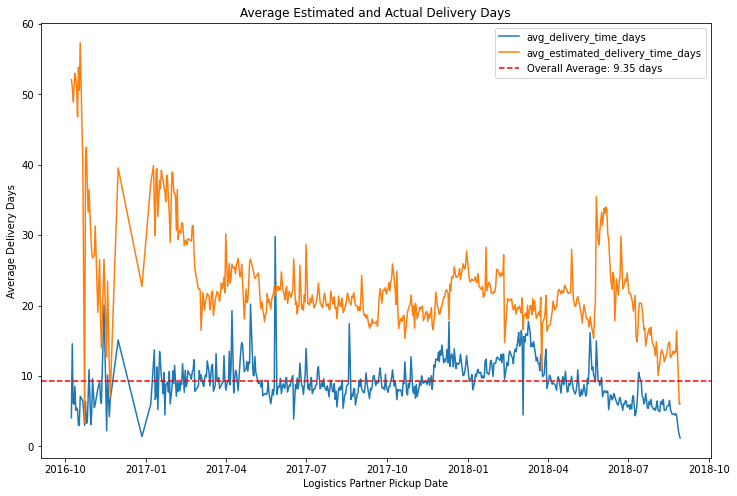

In [61]:
#average delivery days
overall_actual_avg = round(check['delivery_time_days'].mean(),2)

plt.figure(figsize=(12,8))
check.groupby(check.index)['delivery_time_days'].mean().plot(label='avg_delivery_time_days')
check.groupby(check.index)['estimated_delivery_time_days'].mean().plot(label='avg_estimated_delivery_time_days')
plt.axhline(overall_actual_avg, linestyle='--', color='red', label = f'Overall Average: {overall_actual_avg} days')
plt.xlabel('Logistics Partner Pickup Date')
plt.ylabel('Average Delivery Days')
plt.title('Average Estimated and Actual Delivery Days')
plt.legend()
plt.show()

It can be seen from the figure that almost always overestimates delivery times the magnitude of over estimation can be seen in the figure below. Also on the average actual delivery time takes about  ~9days, not sure if this is a good sign but we will know later in the report.

Now let's see the distribution of the error in estimated delivery days, i.e `actual_delivery_date - estimated_delivery_date`

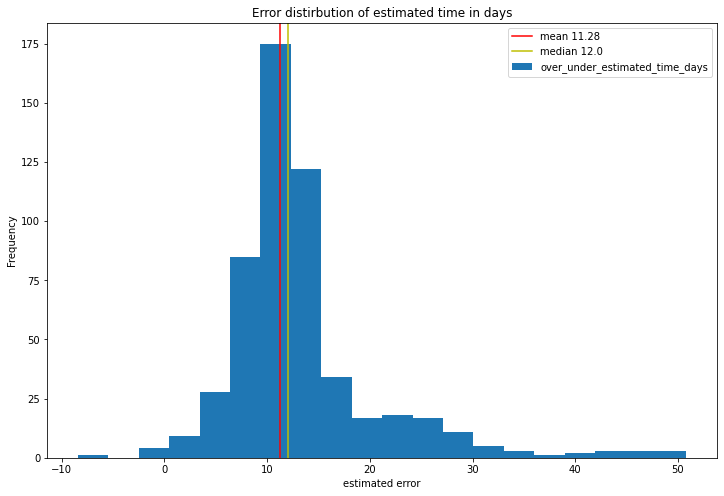

In [62]:
plt.figure(figsize=(12,8))
mean= round(check['over_under_estimated_time_days'].mean(),2)
median = round(check['over_under_estimated_time_days'].median(),2)
check.groupby(check.index)['over_under_estimated_time_days'].mean().plot(kind='hist',bins=20)
plt.axvline(mean, color='r',label=f'mean {mean}')
plt.axvline(median, color='y',label=f'median {median}')
plt.xlabel('estimated error')
plt.title('Error distirbution of estimated time in days')
plt.legend()
plt.show()

The above means `Olist` is always off by 11-12days on the average and there are times they were off by up to `50 days`, that is a lot. let see check for those above `30days`

In [63]:
check[check['over_under_estimated_time_days'] >30]

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,delivery_time_days,estimated_delivery_time_days,over_under_estimated_time_days
order_delivered_carrier_date,,,,,,,,,,,
2017-01-26,76c6e866289321a7c93b82b54852dc33,f54a9f0e6b351c431402b8461ea51999,delivered,2017-01-23 18:29:09,2017-01-25 02:50:47,2017-01-26 14:16:31,2017-02-02 14:08:10,2017-03-06,6.9942,38.4052,31.4110
2018-06-05,acce194856392f074dbf9dada14d8d82,7e20bf5ca92da68200643bda76c504c6,delivered,2018-06-04 00:00:13,2018-06-05 00:35:10,2018-06-05 13:24:00,2018-06-16 15:20:55,2018-07-18,11.0812,42.4417,31.3605
2018-08-06,d22e9fa5731b9e30e8b27afcdc2f8563,756fb9391752dad934e0fe3733378e57,delivered,2018-08-04 23:25:30,2018-08-04 23:35:13,2018-08-06 15:03:00,2018-08-13 23:34:42,2018-09-13,7.3553,37.3729,30.0176
2018-06-06,23f553848a03aaab35bb3f9f87725125,c622b892a190735ef81c0087973fa16d,delivered,2018-06-05 09:10:34,2018-06-05 09:32:22,2018-06-06 15:37:00,2018-06-18 12:36:54,2018-07-23,11.8749,46.3493,34.4744
2017-04-27,d1f54c6a2a7015c5687439d6d4e971ba,be0db8a12224c280772baf2ccb468e5e,delivered,2017-04-27 11:08:59,2017-04-27 11:22:56,2017-04-27 11:51:58,2017-05-15 12:00:17,2017-06-16,18.0058,49.5056,31.4998
...,...,...,...,...,...,...,...,...,...,...,...
2016-10-21,509a52223ecac6d67fb765b3b37c6974,efc07f50d0a9346ec00e1c37b5b10748,delivered,2016-10-06 18:11:11,2016-10-06 18:50:35,2016-10-21 16:23:01,2016-10-26 12:21:06,2016-12-08,4.8320,47.3173,42.4853
2018-06-06,f930a1f6247ed00d6fa9d8a09782c7b4,4ab4db2f93c68d5914dc5eb566dc486c,delivered,2018-06-05 12:28:11,2018-06-05 14:31:34,2018-06-06 13:12:00,2018-06-07 17:28:31,2018-07-11,1.1781,34.4500,33.2719
2018-06-04,c627fe35fce1a754bc5b812d0b8ff379,42b0671b440d1f2527bddd8b723e0a0c,delivered,2018-06-03 18:44:31,2018-06-03 18:55:15,2018-06-04 13:48:00,2018-06-07 13:22:19,2018-07-11,2.9822,36.4250,33.4428


Wow there are more than `2300` and some `order_estimated_delivery_date` off my more than `60 days`.

A look at the distibution of the actual delivery time in days

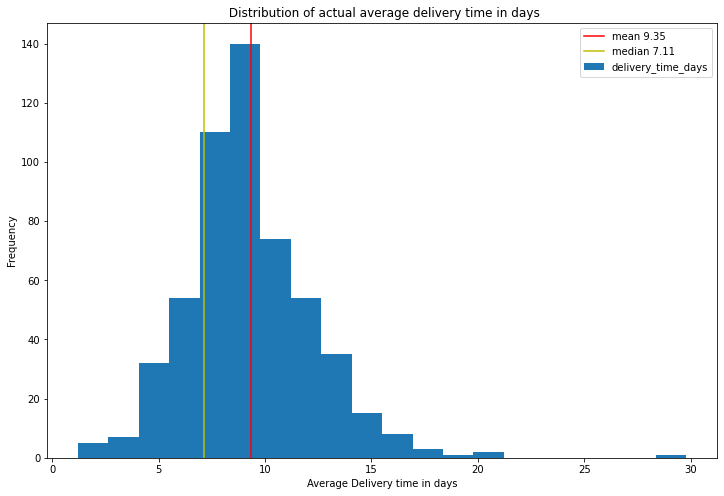

In [64]:
plt.figure(figsize=(12,8))
mean= round(check['delivery_time_days'].mean(),2)
median = round(check['delivery_time_days'].median(),2)
check.groupby(check.index)['delivery_time_days'].mean().plot(kind='hist',bins=20)
plt.axvline(mean, color='r',label=f'mean {mean}')
plt.axvline(median, color='y',label=f'median {median}')
plt.xlabel('Average Delivery time in days')
plt.title(' Distribution of actual average delivery time in days')
plt.legend()
plt.show()

It can be seen above charts that  that Olist Overestimates delivery by about 11days on the average, which means they predict 20days on most deliveries but delivers on the 9th day on average. This may seem good on the face of it, but we have talked about how this is not necessary a good thing as it pertains to customers and Olist as a company.

Check the items that were delivered above `20days` window

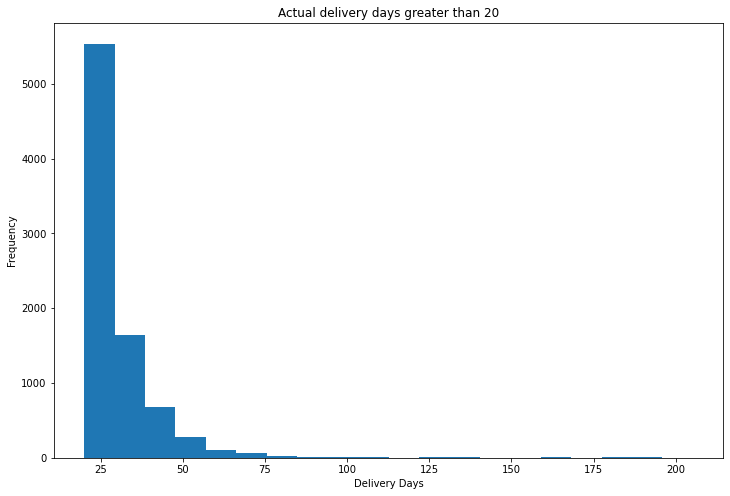

In [115]:
plt.figure(figsize=(12,8))
check[check['delivery_time_days']>20]['delivery_time_days'].plot(kind='hist',bins=20)
plt.title('Actual delivery days greater than 20')
plt.xlabel('Delivery Days')
plt.show()

Wow some delivery days are as long as `200 days` after picked up by logistics partner. this will cause big outliers in our data, we will consider removing them since they are less than `10%` of the whole data set.

The internal process at Olist will be looked at, **how long does it take to approve and process orders?**,because we know that `2016` data appears to be very noisy we will, focus on the data from `2017` and `2018` for this.



In [66]:
delivered_orders_df[delivered_orders_df['order_purchase_timestamp']>= pd.to_datetime('2017-01-01 00:00:00')]

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,delivery_time_days,estimated_delivery_time_days,over_under_estimated_time_days
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,6.0627,13.1701,7.1075
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13,12.0394,17.3951,5.3557
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04,9.1781,26.4236,17.2455
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15,9.4505,22.4306,12.9801
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26,1.9378,11.1760,9.2382
...,...,...,...,...,...,...,...,...,...,...,...
99436,9c5dedf39a927c1b2549525ed64a053c,39bd1228ee8140590ac3aca26f2dfe00,delivered,2017-03-09 09:54:05,2017-03-09 09:54:05,2017-03-10 11:18:03,2017-03-17 15:08:01,2017-03-28,7.1597,17.5291,10.3694
99437,63943bddc261676b46f01ca7ac2f7bd8,1fca14ff2861355f6e5f14306ff977a7,delivered,2018-02-06 12:58:58,2018-02-06 13:10:37,2018-02-07 23:22:42,2018-02-28 17:37:56,2018-03-02,20.7606,22.0259,1.2653
99438,83c1379a015df1e13d02aae0204711ab,1aa71eb042121263aafbe80c1b562c9c,delivered,2017-08-27 14:46:43,2017-08-27 15:04:16,2017-08-28 20:52:26,2017-09-21 11:24:17,2017-09-27,23.6055,29.1303,5.5248
99439,11c177c8e97725db2631073c19f07b62,b331b74b18dc79bcdf6532d51e1637c1,delivered,2018-01-08 21:28:27,2018-01-08 21:36:21,2018-01-12 15:35:03,2018-01-25 23:32:54,2018-02-15,13.3318,33.3507,20.0188


In [67]:
delivered_orders_df['approval_time_hours']=round((delivered_orders_df['order_approved_at']- delivered_orders_df['order_purchase_timestamp']).apply(lambda x : x.total_seconds()/3600),4)

delivered_orders_df['carrier_time_hours']=round((delivered_orders_df['order_delivered_carrier_date']- delivered_orders_df['order_approved_at']).apply(lambda x : x.total_seconds()/3600),4)


In [116]:
#trying to infer the SLA for the approval of orders
Olist_SLA= delivered_orders_df[delivered_orders_df['order_purchase_timestamp']>= pd.to_datetime('2017-01-01 00:00:00')].copy()
Olist_SLA = Olist_SLA.set_index(Olist_SLA['order_purchase_timestamp'].dt.date,drop=True)
avg_approval_time = round(Olist_SLA['approval_time_hours'].mean(),2)

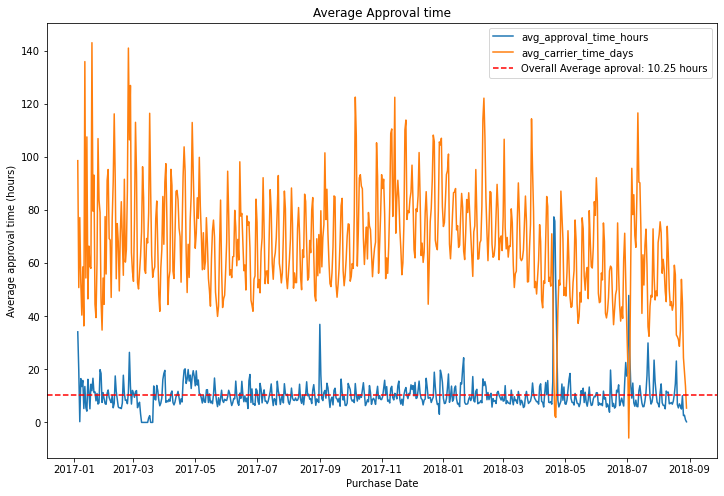

In [118]:
#plot the graph of the average approval time in hours and carrier time

plt.figure(figsize=(12,8))
Olist_SLA.groupby(Olist_SLA.index)['approval_time_hours'].mean().plot(label='avg_approval_time_hours')
Olist_SLA.groupby(Olist_SLA.index)['carrier_time_hours'].mean().plot(label='avg_carrier_time_days')
plt.axhline(avg_approval_time , linestyle='--', color='red', label = f'Overall Average aproval: {avg_approval_time} hours')
plt.xlabel('Purchase Date')
plt.ylabel('Average approval time (hours)')
plt.title('Average Approval time')
plt.legend()
plt.show()

`avg_approval_time` times appears to be stable around `10hour` asided a few spikes here and there. The `avg_carrier_time`, which is the time the logistic partner picks up orders, however is more noisy and unstable. This may be due to the distance of the customer to the seller, probably there are pickup times for each states.

Since we are already including the distance and states feature our modeling, this should cover for the approval time and should not directly affect the time of delivery.


## Consolidating Data sets

At this stage we will be joining all the tables in our schema

Starting with joining both `OrderItems` and `delivered_orders_df` tables

In [70]:
order_detail = delivered_orders_df.merge(orderItems,
                                      left_on='order_id', right_on='order_id',how='left')
order_detail.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,delivery_time_days,estimated_delivery_time_days,over_under_estimated_time_days,approval_time_hours,carrier_time_hours,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,6.0627,13.1701,7.1075,0.1783,56.7958,1,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,2017-10-06 11:07:15,29.99,8.72
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13,12.0394,17.3951,5.3557,30.7139,11.1092,1,595fac2a385ac33a80bd5114aec74eb8,289cdb325fb7e7f891c38608bf9e0962,2018-07-30 03:24:27,118.70,22.76
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04,9.1781,26.4236,17.2455,0.2761,4.9103,1,aa4383b373c6aca5d8797843e5594415,4869f7a5dfa277a7dca6462dcf3b52b2,2018-08-13 08:55:23,159.90,19.22
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15,9.4505,22.4306,12.9801,0.2981,89.9000,1,d0b61bfb1de832b15ba9d266ca96e5b0,66922902710d126a0e7d26b0e3805106,2017-11-23 19:45:59,45.00,27.20
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26,1.9378,11.1760,9.2382,1.0306,21.4347,1,65266b2da20d04dbe00c5c2d3bb7859e,2c9e548be18521d1c43cde1c582c6de8,2018-02-19 20:31:37,19.90,8.72


Confirming if there are missing values in the data..

In [71]:
orderItems.shape[0],delivered_orders_df.shape[0],order_detail.shape[0]

(112650, 96455, 110173)

In [72]:
order_detail.isna().sum()

order_id                          0
customer_id                       0
order_status                      0
order_purchase_timestamp          0
order_approved_at                 0
order_delivered_carrier_date      0
order_delivered_customer_date     0
order_estimated_delivery_date     0
delivery_time_days                0
estimated_delivery_time_days      0
over_under_estimated_time_days    0
approval_time_hours               0
carrier_time_hours                0
order_item_id                     0
product_id                        0
seller_id                         0
shipping_limit_date               0
price                             0
freight_value                     0
dtype: int64

Reaarranging the columns for better eligibility 

In [73]:
order_detail = order_detail[['order_id', 'customer_id', 'product_id',
       'seller_id','order_item_id', 'order_status', 'order_purchase_timestamp',
       'order_approved_at','shipping_limit_date', 'order_delivered_carrier_date',
       'order_delivered_customer_date', 'order_estimated_delivery_date',
       'delivery_time_days', 'estimated_delivery_time_days',
       'over_under_estimated_time_days', 'price', 'freight_value']]
order_detail.head()

,order_id,customer_id,product_id,seller_id,order_item_id,order_status,order_purchase_timestamp,order_approved_at,shipping_limit_date,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,delivery_time_days,estimated_delivery_time_days,over_under_estimated_time_days,price,freight_value
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,1,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-06 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,6.0627,13.1701,7.1075,29.99,8.72
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,595fac2a385ac33a80bd5114aec74eb8,289cdb325fb7e7f891c38608bf9e0962,1,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-30 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13,12.0394,17.3951,5.3557,118.70,22.76
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,aa4383b373c6aca5d8797843e5594415,4869f7a5dfa277a7dca6462dcf3b52b2,1,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-13 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04,9.1781,26.4236,17.2455,159.90,19.22
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,d0b61bfb1de832b15ba9d266ca96e5b0,66922902710d126a0e7d26b0e3805106,1,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-23 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15,9.4505,22.4306,12.9801,45.00,27.20
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,65266b2da20d04dbe00c5c2d3bb7859e,2c9e548be18521d1c43cde1c582c6de8,1,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-19 20:31:37,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26,1.9378,11.1760,9.2382,19.90,8.72


Next we will join the table with the `order_detail` with the `product_category_english`

In [74]:
full_order_detail  = order_detail.merge(product_category_english,
                                      left_on='product_id', right_on='product_id',how='left')
full_order_detail.head()

,order_id,customer_id,product_id,seller_id,order_item_id,order_status,order_purchase_timestamp,order_approved_at,shipping_limit_date,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,delivery_time_days,estimated_delivery_time_days,over_under_estimated_time_days,price,freight_value,product_category_name_english,product_weight_g,product_volume_cm3
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,1,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-06 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,6.0627,13.1701,7.1075,29.99,8.72,housewares,500.0,1976.0
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,595fac2a385ac33a80bd5114aec74eb8,289cdb325fb7e7f891c38608bf9e0962,1,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-30 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13,12.0394,17.3951,5.3557,118.70,22.76,perfumery,400.0,4693.0
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,aa4383b373c6aca5d8797843e5594415,4869f7a5dfa277a7dca6462dcf3b52b2,1,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-13 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04,9.1781,26.4236,17.2455,159.90,19.22,auto,420.0,9576.0
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,d0b61bfb1de832b15ba9d266ca96e5b0,66922902710d126a0e7d26b0e3805106,1,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-23 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15,9.4505,22.4306,12.9801,45.00,27.20,pet_shop,450.0,6000.0
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,65266b2da20d04dbe00c5c2d3bb7859e,2c9e548be18521d1c43cde1c582c6de8,1,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-19 20:31:37,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26,1.9378,11.1760,9.2382,19.90,8.72,stationery,250.0,11475.0


Also checking the shape of the full table and the subsets plus confirming if there are missing values

In [75]:
order_detail.shape[0],product_category_english.shape[0], full_order_detail.shape[0]

(110173, 32949, 110173)

- Confirming if there are null values 

In [76]:
full_order_detail.isna().sum()

order_id                             0
customer_id                          0
product_id                           0
seller_id                            0
order_item_id                        0
order_status                         0
order_purchase_timestamp             0
order_approved_at                    0
shipping_limit_date                  0
order_delivered_carrier_date         0
order_delivered_customer_date        0
order_estimated_delivery_date        0
delivery_time_days                   0
estimated_delivery_time_days         0
over_under_estimated_time_days       0
price                                0
freight_value                        0
product_category_name_english     1537
product_weight_g                    18
product_volume_cm3                  18
dtype: int64

In [77]:
full_order_detail[full_order_detail.isna().any(axis=1)].head()

,order_id,customer_id,product_id,seller_id,order_item_id,order_status,order_purchase_timestamp,order_approved_at,shipping_limit_date,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,delivery_time_days,estimated_delivery_time_days,over_under_estimated_time_days,price,freight_value,product_category_name_english,product_weight_g,product_volume_cm3
119,bfe42c22ecbf90bc9f35cf591270b6a7,803ac05904124294f8767894d6da532b,71225f49be70df4297892f6a5fa62171,e5a3438891c0bfdb9394643f95273d8e,1,delivered,2018-01-27 22:04:34,2018-01-27 22:16:18,2018-01-31 22:16:18,2018-02-03 03:56:00,2018-02-09 20:16:40,2018-02-26,6.6810,22.8361,16.1551,27.30,15.10,NaN,200.0,352.0
206,58ac1947c1a9067b9f416cba6d844a3f,ee8e1d37f563ecc11cc4dcb4dfd794c2,9820e04e332fc450d6fd975befc1bc28,520b493b57809f446cb0a233bb3e25c7,1,delivered,2017-09-13 09:18:50,2017-09-13 13:45:43,2017-09-19 13:45:43,2017-09-14 21:20:03,2017-09-21 21:16:17,2017-09-25,6.9974,10.1111,3.1137,110.00,14.16,NaN,10800.0,48000.0
258,e22b71f6e4a481445ec4527cb4c405f7,1faf89c8f142db3fca6cf314c51a37b6,3bc5164bc7f4be77002d6651da65c98c,6cd68b3ed6d59aaa9fece558ad360c0a,1,delivered,2017-04-22 13:48:18,2017-04-22 14:01:13,2017-04-27 14:01:13,2017-04-24 19:08:53,2017-05-02 15:45:27,2017-05-11,7.8587,16.2022,8.3434,22.50,11.74,NaN,550.0,3344.0
296,a094215e786240fcfefb83d18036a1cd,86acfb656743da0c113d176832c9d535,5a848e4ab52fd5445cdc07aab1c40e48,c826c40d7b19f62a09e2d7c5e7295ee2,1,delivered,2018-02-08 18:56:45,2018-02-08 19:32:18,2018-02-14 19:10:08,2018-02-09 21:41:54,2018-02-19 13:28:50,2018-02-22,9.6576,12.0959,2.4383,122.99,9.06,NaN,400.0,3600.0
365,6f841dde94727854eaff3f66432c80ea,a9c9532060c9d245f06526c633d2dfba,c600d7f13104e8db2ca2b9fa78581409,f18112da765e0971ca5d510dec322bdd,1,delivered,2018-01-02 19:20:35,2018-01-02 19:32:22,2018-01-08 19:32:22,2018-01-03 17:34:42,2018-01-27 14:27:59,2018-02-05,23.8703,32.2676,8.3972,168.90,24.05,NaN,2400.0,17010.0


A critical look at the missing values, most of the items are coming from `product_category_name_english` column,this has very little impact on our modeling but is of use in performing EDA on a prudct level basis.

We will leave them for now and explore the other null values

In [78]:
full_order_detail[full_order_detail['product_weight_g'].isna()]

,order_id,customer_id,product_id,seller_id,order_item_id,order_status,order_purchase_timestamp,order_approved_at,shipping_limit_date,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,delivery_time_days,estimated_delivery_time_days,over_under_estimated_time_days,price,freight_value,product_category_name_english,product_weight_g,product_volume_cm3
8128,6e150190fbe04c642a9cf0b80d83ee16,135a42a465867ff932f1222f71a3efb2,5eb564652db742ff8f28759cd8d2652a,4e922959ae960d389249c378d1c939f5,1,delivered,2017-06-24 16:33:35,2017-06-24 16:45:14,2017-06-30 16:45:14,2017-06-29 16:08:40,2017-07-07 18:35:52,2017-07-31,8.1022,31.3273,23.2251,39.0,16.79,NaN,NaN,NaN
8568,d38dcb503cd4ddc6ce7702552918bd8f,b0a3a02fe893d9a9385a98db1348244b,5eb564652db742ff8f28759cd8d2652a,4e922959ae960d389249c378d1c939f5,1,delivered,2017-06-04 17:44:18,2017-06-04 17:55:13,2017-06-09 17:55:13,2017-06-05 16:13:33,2017-06-14 16:38:11,2017-07-05,9.0171,29.3239,20.3068,39.0,15.10,NaN,NaN,NaN
8569,d38dcb503cd4ddc6ce7702552918bd8f,b0a3a02fe893d9a9385a98db1348244b,5eb564652db742ff8f28759cd8d2652a,4e922959ae960d389249c378d1c939f5,2,delivered,2017-06-04 17:44:18,2017-06-04 17:55:13,2017-06-09 17:55:13,2017-06-05 16:13:33,2017-06-14 16:38:11,2017-07-05,9.0171,29.3239,20.3068,39.0,15.10,NaN,NaN,NaN
20934,ddf16d77e858a32f36e10c289a28ef61,84cc013dd1790fdafb0fa598695cf3c3,5eb564652db742ff8f28759cd8d2652a,4e922959ae960d389249c378d1c939f5,1,delivered,2017-04-24 10:36:24,2017-04-24 10:50:08,2017-05-02 10:50:08,2017-04-25 10:59:46,2017-05-05 12:42:39,2017-05-18,10.0714,22.5418,12.4704,29.0,14.52,NaN,NaN,NaN
31194,1521c6bb7b1028154c8c67cf80fa809f,ca29b2bf57243228e98eab2dab805ae9,5eb564652db742ff8f28759cd8d2652a,4e922959ae960d389249c378d1c939f5,1,delivered,2017-04-02 10:00:43,2017-04-02 10:10:16,2017-04-07 10:10:16,2017-04-04 16:19:55,2017-04-18 13:53:58,2017-05-04,13.8986,29.3195,15.4209,29.0,16.05,NaN,NaN,NaN
35179,e3daea0200104991cb979c2fcc509ae7,4730251e8934a542a009d77dfd027375,5eb564652db742ff8f28759cd8d2652a,4e922959ae960d389249c378d1c939f5,1,delivered,2017-03-30 14:07:44,2017-03-30 14:22:36,2017-04-06 14:22:36,2017-03-31 22:06:32,2017-04-07 14:43:38,2017-04-25,6.6924,24.0788,17.3864,29.0,10.96,NaN,NaN,NaN
39589,415cfaaaa8cea49f934470548797fed1,a8dff6357fea30071032ff2091d16430,5eb564652db742ff8f28759cd8d2652a,4e922959ae960d389249c378d1c939f5,1,delivered,2017-04-02 10:25:38,2017-04-02 10:35:19,2017-04-07 10:35:19,2017-04-13 04:37:45,2017-04-29 10:14:19,2017-05-02,16.2337,18.8071,2.5734,29.0,14.52,NaN,NaN,NaN
39590,415cfaaaa8cea49f934470548797fed1,a8dff6357fea30071032ff2091d16430,5eb564652db742ff8f28759cd8d2652a,4e922959ae960d389249c378d1c939f5,2,delivered,2017-04-02 10:25:38,2017-04-02 10:35:19,2017-04-07 10:35:19,2017-04-13 04:37:45,2017-04-29 10:14:19,2017-05-02,16.2337,18.8071,2.5734,29.0,14.52,NaN,NaN,NaN
42455,85f8ad45e067abd694b627859fa57453,1d088dea8732788ec35dd4ee6dd76112,09ff539a621711667c43eba6a3bd8466,8b8cfc8305aa441e4239358c9f6f2485,1,delivered,2017-01-29 21:40:02,2017-01-30 22:32:20,2017-02-03 21:40:02,2017-02-02 05:04:58,2017-02-07 10:46:00,2017-03-08,5.2368,33.7882,28.5514,1934.0,27.00,NaN,NaN,NaN
45610,101157d4fae1c9fb74a00a5dee265c25,f72b2f8d9295ef93fd40a4c49f67a42b,5eb564652db742ff8f28759cd8d2652a,4e922959ae960d389249c378d1c939f5,1,delivered,2017-04-03 07:54:34,2017-04-04 08:02:26,2017-04-11 08:02:26,2017-04-12 08:58:13,2017-04-13 21:08:08,2017-05-02,1.5069,19.6262,18.1194,29.0,14.52,NaN,NaN,NaN


The 18 data points above will not be useful to us for the analysis , is does not have `product_weight` and `product_volume`, key components for our model

Filling this value using the `product_category` would have also help, but they column is contains non values, therefore we will drop this row

In [79]:
full_order_detail = full_order_detail[full_order_detail['product_weight_g'].notna()]

Next we merge with `sellers` and `customers` table

first we start with `customers` table

In [80]:
full_order_detail_customers = full_order_detail.merge(customer_with_location,
                                      left_on='customer_id', right_on='customer_id',how='left')
full_order_detail_customers.head()

,order_id,customer_id,product_id,seller_id,order_item_id,order_status,order_purchase_timestamp,order_approved_at,shipping_limit_date,order_delivered_carrier_date,...,freight_value,product_category_name_english,product_weight_g,product_volume_cm3,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,customer_lat,customer_lng
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,1,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-06 11:07:15,2017-10-04 19:55:00,...,8.72,housewares,500.0,1976.0,7c396fd4830fd04220f754e42b4e5bff,3149.0,sao paulo,SP,-23.574809,-46.587471
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,595fac2a385ac33a80bd5114aec74eb8,289cdb325fb7e7f891c38608bf9e0962,1,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-30 03:24:27,2018-07-26 14:31:00,...,22.76,perfumery,400.0,4693.0,af07308b275d755c9edb36a90c618231,47813.0,barreiras,BA,-12.169860,-44.988369
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,aa4383b373c6aca5d8797843e5594415,4869f7a5dfa277a7dca6462dcf3b52b2,1,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-13 08:55:23,2018-08-08 13:50:00,...,19.22,auto,420.0,9576.0,3a653a41f6f9fc3d2a113cf8398680e8,75265.0,vianopolis,GO,-16.746337,-48.514624
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,d0b61bfb1de832b15ba9d266ca96e5b0,66922902710d126a0e7d26b0e3805106,1,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-23 19:45:59,2017-11-22 13:39:59,...,27.20,pet_shop,450.0,6000.0,7c142cf63193a1473d2e66489a9ae977,59296.0,sao goncalo do amarante,RN,-5.767733,-35.275467
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,65266b2da20d04dbe00c5c2d3bb7859e,2c9e548be18521d1c43cde1c582c6de8,1,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-19 20:31:37,2018-02-14 19:46:34,...,8.72,stationery,250.0,11475.0,72632f0f9dd73dfee390c9b22eb56dd6,9195.0,santo andre,SP,-23.675037,-46.524784


- Confirming the sizes of the previous and current table

In [81]:
full_order_detail_customers.shape[0],full_order_detail.shape[0]

(110155, 110155)

Joining the `sellers` table

In [82]:
full_transaction = full_order_detail_customers.merge(sellers_with_location,
                                      left_on='seller_id', right_on='seller_id',how='left')
full_transaction.head()

,order_id,customer_id,product_id,seller_id,order_item_id,order_status,order_purchase_timestamp,order_approved_at,shipping_limit_date,order_delivered_carrier_date,...,customer_zip_code_prefix,customer_city,customer_state,customer_lat,customer_lng,seller_zip_code_prefix,seller_city,seller_state,seller_lat,seller_lng
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,1,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-06 11:07:15,2017-10-04 19:55:00,...,3149.0,sao paulo,SP,-23.574809,-46.587471,9350.0,maua,SP,-23.680114,-46.452454
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,595fac2a385ac33a80bd5114aec74eb8,289cdb325fb7e7f891c38608bf9e0962,1,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-30 03:24:27,2018-07-26 14:31:00,...,47813.0,barreiras,BA,-12.169860,-44.988369,31570.0,belo horizonte,SP,-19.810119,-43.984727
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,aa4383b373c6aca5d8797843e5594415,4869f7a5dfa277a7dca6462dcf3b52b2,1,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-13 08:55:23,2018-08-08 13:50:00,...,75265.0,vianopolis,GO,-16.746337,-48.514624,14840.0,guariba,SP,-21.362358,-48.232976
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,d0b61bfb1de832b15ba9d266ca96e5b0,66922902710d126a0e7d26b0e3805106,1,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-23 19:45:59,2017-11-22 13:39:59,...,59296.0,sao goncalo do amarante,RN,-5.767733,-35.275467,31842.0,belo horizonte,MG,-19.840168,-43.923299
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,65266b2da20d04dbe00c5c2d3bb7859e,2c9e548be18521d1c43cde1c582c6de8,1,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-19 20:31:37,2018-02-14 19:46:34,...,9195.0,santo andre,SP,-23.675037,-46.524784,8752.0,mogi das cruzes,SP,-23.551707,-46.260979


In [83]:
full_transaction.shape[0],full_order_detail.shape[0]

(110155, 110155)

In [84]:
full_transaction.isna().sum()

order_id                             0
customer_id                          0
product_id                           0
seller_id                            0
order_item_id                        0
order_status                         0
order_purchase_timestamp             0
order_approved_at                    0
shipping_limit_date                  0
order_delivered_carrier_date         0
order_delivered_customer_date        0
order_estimated_delivery_date        0
delivery_time_days                   0
estimated_delivery_time_days         0
over_under_estimated_time_days       0
price                                0
freight_value                        0
product_category_name_english     1519
product_weight_g                     0
product_volume_cm3                   0
customer_unique_id                   6
customer_zip_code_prefix             6
customer_city                        6
customer_state                       6
customer_lat                       294
customer_lng             

Everything appears to be good now 

Next we will drop columns without the Lon and Lat values, location is a great factor in our model

In [85]:
full_transaction = full_transaction[(full_transaction['customer_lat'].notna()) & (full_transaction['seller_lat'].notna())]
full_transaction.isna().sum()

order_id                             0
customer_id                          0
product_id                           0
seller_id                            0
order_item_id                        0
order_status                         0
order_purchase_timestamp             0
order_approved_at                    0
shipping_limit_date                  0
order_delivered_carrier_date         0
order_delivered_customer_date        0
order_estimated_delivery_date        0
delivery_time_days                   0
estimated_delivery_time_days         0
over_under_estimated_time_days       0
price                                0
freight_value                        0
product_category_name_english     1512
product_weight_g                     0
product_volume_cm3                   0
customer_unique_id                   0
customer_zip_code_prefix             0
customer_city                        0
customer_state                       0
customer_lat                         0
customer_lng             

Now we can start working with the full datasets

In [120]:
f'We are left with {full_transaction.shape[0]} rows and {full_transaction.shape[1]} columns '

'We are left with 109613 rows and 31 columns '

In [87]:
full_transaction.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 109613 entries, 0 to 110154
Data columns (total 31 columns):
 #   Column                          Non-Null Count   Dtype         
---  ------                          --------------   -----         
 0   order_id                        109613 non-null  object        
 1   customer_id                     109613 non-null  object        
 2   product_id                      109613 non-null  object        
 3   seller_id                       109613 non-null  object        
 4   order_item_id                   109613 non-null  int64         
 5   order_status                    109613 non-null  object        
 6   order_purchase_timestamp        109613 non-null  datetime64[ns]
 7   order_approved_at               109613 non-null  datetime64[ns]
 8   shipping_limit_date             109613 non-null  datetime64[ns]
 9   order_delivered_carrier_date    109613 non-null  datetime64[ns]
 10  order_delivered_customer_date   109613 non-null  datetim

In [95]:
full_transaction.describe().T

,count,mean,std,min,25%,50%,75%,max
order_item_id,109613.0,1.198517,0.707779,1.000000,1.000000,1.000000,1.000000,21.000000
delivery_time_days,109613.0,9.176756,8.621936,-16.096200,4.056100,7.055100,11.900100,205.191000
estimated_delivery_time_days,109613.0,20.513210,8.829448,-99.656000,14.626100,20.259700,25.619200,192.434000
over_under_estimated_time_days,109613.0,11.336454,10.160810,-188.975100,6.477100,12.047700,16.321300,146.016100
price,109613.0,120.001197,182.432664,0.850000,39.900000,74.900000,134.550000,6735.000000
freight_value,109613.0,19.941168,15.712456,0.000000,13.070000,16.250000,21.150000,409.680000
product_weight_g,109613.0,2087.857225,3736.402090,0.000000,300.000000,700.000000,1800.000000,40425.000000
product_volume_cm3,109613.0,15198.032697,23269.981657,168.000000,2850.000000,6468.000000,18354.000000,296208.000000
customer_zip_code_prefix,109613.0,35073.547180,29886.854751,1003.000000,11089.000000,24241.000000,58745.000000,99980.000000
customer_lat,109613.0,-21.250053,5.552026,-36.605374,-23.591202,-22.931096,-20.198222,3.844901


 


**The concluding part of EDA on the combined data sets was done on Tableau is attached as `Full Data EDA`**

---

In [93]:
#Data to be used in the next section

full_transaction.to_csv('clean_data/new_data.csv', header=True)

---

# Summary

This concludes the `Data Preprocession` and `EDA` Section, In this section the following were achieved:


- The background and business case of the project was looked at

- The data, its source and its content was looked at

- All tables, `customer`, `sellers`, `geolocation`, `orderItems`,`orders` and `Products` tables were looked at and cleaned seperately

- All the above list tables were then joined to form a big table, with `~109k rows` and `30 columns`


**Next Sections, the following will be looked at:** 

- Feature engineering

- Modelling and evaluation

- Summary of findings